# Description

This notebook is used for processing of the raw Medium data, as well as EDA. 

In [10]:
#Data manipulation
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
import numpy as np

#Text processing
import spacy
from spacy.matcher import Matcher
import re
from collections import Counter

#Visualization
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn
plt.style.use('seaborn')

#Topic modeling
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

#Language model
nlp = spacy.load("en_core_web_sm")
matcher = Matcher(nlp.vocab)
#Fonts for plots
header_font = fm.FontProperties(fname='../Fonts/Oswald-VariableFont_wght.ttf', size = 14)
text_font = fm.FontProperties(fname='../Fonts/SairaCondensed-Regular.ttf', size = 14)

In [11]:
#Adapted from https://gist.github.com/armsp/30c2c1e19a0f1660944303cf079f831a

#Checks if any dependency tags are passive subjects
passive_rule = [{'DEP': 'nsubjpass'}]
matcher.add('Passive', None, passive_rule)

def pass_voice_det(row):
    """
    
    Returns the percentage of sentences
    containing passive voice.
    
    """
    sents = list(row.sents)
    matches = matcher(row)
    return len(matches)/len(sents)

In [12]:
def mean_sent_length(row):
    """
    
    Returns the mean sentence length, and
    removes punctuation before computing
    sentence length.
    
    """
    sents = list(row.sents)
    #Remove punc
    words_punc_removed = [tok for tok in row if tok.is_punct == False]
    return len(words_punc_removed)/len(sents)

In [13]:
def avg_word_length(row):
    """
    
    Removes stop-words and then calculates
    average word length in doc.
    
    """
    return np.mean([len(tok) for tok in row if tok.is_punct == False and tok.is_stop == False])

In [14]:
def total_post_length(row):
    """
    
    Removes punctuation and then calculates
    total post length.
    
    """
    
    return len([tok for tok in row if tok.is_punct == False])

In [15]:
def lemmatize_post(row):
    """
    
    Removes stop-words and punctuation to lemmatize 
    tokens in post.
    
    """
    return [tok.lemma_ for tok in row if tok.is_punct == False and tok.is_stop == False]

In [16]:
def unique_words(row):
    """
    
    Returns unique words used in post.
    
    """
    unique = set([tok.lemma_ for tok in row if tok.is_punct == False and tok.is_stop == False])
    
    
    return len(set(unique))

In [17]:
def unique_words_prop(row):
    """
    
    Returns proportion of unique words relative to overall post length.
    
    """
    
    unique = set([tok.lemma_ for tok in row if tok.is_punct == False and tok.is_stop == False])
    post_length = len([tok.lemma_ for tok in row if tok.is_punct == False])
    
    return len(set(unique))/post_length

# Data

First, I loaded the entirety of the scraped Medium articles (N = 9969). Some simple formatting is done to turn all claps into integers, and before the post text is analyze, I use spaCy to tokenize the posts. 

In [18]:
import pandas as pd

In [19]:
sample = pd.read_pickle('../Data/medium_2020_posts.pkl', compression = 'bz2')

In [20]:
sample.tail()

,date,title,post,num_sections,num_images,num_codeblocks,num_videos,claps
9964,2020-07-06,A visual exploration of Multi-Armed Bandit exp...,Working in a Marketing Data Science department...,5,10,0,0,56
9965,2020-07-06,Quit Trying to Predict The Market,All too often I get the same types of articles...,4,5,4,0,444
9966,2020-07-06,5 Wrong Use Cases Of Python List Comprehensions,List comprehensions are unarguably the most po...,8,1,11,0,59
9967,2020-07-06,10 Ways to Deploy and Serve AI Models to Make ...,Creating a model is just one step in the journ...,17,3,1,0,6
9968,2020-07-06,Ten Python development skills,"Every now and again, when I learn about a new ...",14,30,5,0,539


In [21]:
sample.shape

(9969, 8)

In [22]:
#Convert claps (e.g., 3k) to ints
sample['claps'] = sample['claps'].map(lambda x: float(x.split('K')[0])*1000 if 'K' in x else x).astype('int')

In [23]:
#Tokenize posts
sample['tokens'] = sample['post'].map(lambda x: nlp(x.lower()))

Below is where the text pre-processing occurs. Greater detail can be found in the functions' doc strings above.

1. Passive voice identifier - proportion of post containing passive voice
2. Mean sentence length
3. Mean word length
4. Total post length
5. Avg words per section
6. Avg words per image
7. Avg words per codeblock
8. Avg images per section
9. Unique words
10. Proportion of unique words to post length

In [24]:
#1
sample['pass_voice_perc'] = sample['tokens'].map(pass_voice_det)
#2
sample['mean_sent_len'] = sample['tokens'].map(mean_sent_length)
#3
sample['avg_word_len'] = sample['tokens'].map(avg_word_length)
#4
sample['post_len'] = sample['tokens'].map(total_post_length)
#5
sample['section_len_prop'] = sample['num_sections']/sample['post_len']
#6
sample['img_len_prop'] = sample['num_images']/sample['post_len']
#7
sample['codeblock_len_prop'] = sample['num_codeblocks']/sample['post_len']
#8
sample['section_img_ratio'] = sample['num_images']/sample['num_sections']
#9
sample['unique_words'] = sample['tokens'].map(unique_words)
#10
sample['unique_words_prop'] = sample['tokens'].map(unique_words_prop)
#11
sample['title_len'] = sample['title'].map(lambda x: total_post_length(nlp(x)))

In [313]:
sample.head()

,date,title,post,num_sections,num_images,num_codeblocks,num_videos,claps,tokens,pass_voice_perc,mean_sent_len,avg_word_len,post_len,section_len_prop,img_len_prop,codeblock_len_prop,section_img_ratio,unique_words,unique_words_prop,title_len
0,2020-01-01,Making Python Programs Blazingly Fast,"Python haters always say, that one of the reas...",14,1,9,0,3300,"(python, haters, always, say, ,, that, one, of...",0.156863,19.549020,6.284722,997,0.014042,0.001003,0.009027,0.071429,255,0.255767,5
1,2020-01-01,6 New Features in Python 3.8 for Python Newbies,Languages change. Languages adapt. Python 2 is...,13,4,4,0,1700,"(languages, change, ., languages, adapt, ., py...",0.132075,12.622642,6.395137,669,0.019432,0.005979,0.005979,0.307692,191,0.285501,9
2,2020-01-01,How to be fancy with Python,"Python is cool. Really cool. However, a lot of...",9,17,0,0,1600,"(python, is, cool, ., really, cool, ., however...",0.094340,11.962264,5.911765,634,0.014196,0.026814,0.000000,1.888889,151,0.238170,6
3,2020-01-01,Understanding and implementing a fully convolu...,Convolutional neural networks (CNN) work great...,14,1,4,0,254,"(convolutional, neural, networks, (, cnn, ), w...",0.205607,18.242991,6.738119,1952,0.007172,0.000512,0.002049,0.071429,430,0.220287,8
4,2020-01-01,Perfectly Privacy-Preserving AI,Data privacy has been called “the most importa...,10,3,0,0,200,"(data, privacy, has, been, called, “, the, mos...",0.154930,19.676056,6.646007,1397,0.007158,0.002147,0.000000,0.300000,465,0.332856,4


In [23]:
#Checking for questionable values, NaNs, etc. 
sample.describe()

,num_sections,num_images,num_codeblocks,num_videos,claps,pass_voice_perc,mean_sent_len,avg_word_len,post_len,section_len_prop,img_len_prop,codeblock_len_prop,section_img_ratio,unique_words,unique_words_prop,title_len
count,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000,9969.000000
mean,9.808807,8.133915,4.793159,0.054369,160.927375,0.161570,17.721594,6.540515,1242.606681,0.009657,0.007438,0.004918,1.178662,289.032400,0.249973,7.862674
std,6.915925,8.659560,7.667704,0.304549,440.025321,0.110695,3.575061,0.415949,788.967967,0.010598,0.007005,0.007808,1.776871,140.654686,0.051293,3.008332
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.200000,3.531981,23.000000,0.000218,0.000000,0.000000,0.000000,10.000000,0.067702,1.000000
25%,6.000000,3.000000,0.000000,0.000000,18.000000,0.083333,15.285714,6.278183,749.000000,0.004922,0.002967,0.000000,0.375000,193.000000,0.215686,6.000000
50%,9.000000,6.000000,1.000000,0.000000,64.000000,0.140097,17.400000,6.533333,1066.000000,0.007895,0.005643,0.001352,0.727273,262.000000,0.246066,8.000000
75%,12.000000,11.000000,7.000000,0.000000,159.000000,0.212500,19.833333,6.788905,1522.000000,0.012048,0.009693,0.007511,1.333333,353.000000,0.280184,10.000000
max,118.000000,302.000000,155.000000,7.000000,14300.000000,1.176471,38.833333,13.051020,10930.000000,0.647059,0.123457,0.111111,66.000000,1300.000000,0.625000,25.000000


## Topic Modeling

The general workflow below can be outlined as follows:

1. Gather top 20% of words in the corpus
2. Create tf-idf vectors
3. Using vectors from the top words, perform LSA to extract topics
4. Format LSA components for use as features in later regressions

In [315]:
#Preparing text for tf-idf
corpus = (sample['tokens']
          .map(lemmatize_post)
          .map(lambda x: ' '.join([word for word in x]))
          .tolist()
         )

In [316]:
#Sanity check
len(corpus) == sample.shape[0]

True

In [317]:
def top_words(corpus = list, percent = .2):
    """
    
    Returns, by default, the top 20% of word frequencies in corpus.
    Corpus input should be a list of documents, and percent should
    be a float <= 1.0.
    
    """
    word_counter = Counter()
    pattern = re.compile("[A-Za-z]+")

    for doc in corpus:
        for word in doc.split(' '):
            if pattern.fullmatch(word) and len(word) > 1:
                word_counter[word] += 1
        else:
            pass
    
    num_words = round(len(word_counter)*percent)
    
    return [word for word, count in word_counter.most_common(num_words)]

In [318]:
def tfidf_df(corpus = list):
    """
    
    Returns a dataframe containing tf-idf vectors.
    
    By default, the tf-idf vectors are of the top 20%
    of words in the corpus. 
    
    """
    words = top_words(corpus)
    
    vectorizer = TfidfVectorizer()
    X = vectorizer.fit_transform(corpus)
    
    tfidf_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names())
    
    word_vec_df = tfidf_df[[col for col in tfidf_df.columns if col in words]]
    
    return word_vec_df

In [28]:
top_tfidf = tfidf_df(corpus)
top_tfidf.head()

,aa,aaa,aaai,aae,aapl,aaron,ab,abae,abandon,abbreviate,abbreviation,abbyy,abc,abhishek,abide,ability,ablation,able,abnormal,abnormality,abnormally,aboard,abound,abroad,abrupt,abs,absence,absent,absolute,absolutely,absorb,absorbance,abstain,abstract,abstraction,abstractive,absurd,abundance,abundant,abuse,abusive,abysmal,ac,aca,academia,academic,academy,acc,accelerate,accelerated,acceleration,accelerator,accelerometer,accent,accenture,accept,acceptable,acceptance,accepted,access,accessibility,accessible,accessor,accessory,accident,accidental,accidentally,accommodate,accommodation,accompany,accompanying,accomplish,accomplishment,accord,accordance,accordingly,account,accountability,accountable,accountant,accounting,accrue,accumulate,accumulation,accumulator,accuracy,accurate,accurately,accusation,accuse,accustomed,ace,acf,achievable,achieve,achievement,acid,acidity,ack,acknowledge,acknowledgement,acknowledgment,acl,acm,acnh,acoustic,acousticness,acquaint,acquaintance,acquire,acquisition,acre,acronym,acs,act,action,actionable,activate,activation,active,actively,activist,activity,actor,actual,actually,actuarial,actuary,actuator,acute,acyclic,ad,ada,adaboost,adadelta,adagrad,adaline,adam,adams,adapt,adaptability,adaptable,adaptation,adapter,adaptive,add,addict,addiction,addin,addition,additional,additionally,additive,address,adept,adequate,adequately,adf,adhere,adj,adjacency,adjacent,adjective,adjoint,adjunct,adjust,adjustable,adjusted,adjustment,admin,administer,administration,administrative,administrator,admire,admission,admit,admittedly,admond,ado,adobe,adopt,adopter,adoption,adp,adr,adrian,adult,advance,advanced,advancement,advantage,advantageous,advent,adventure,adventurous,adverb,adversarial,adversary,adverse,adversely,advert,advertise,advertisement,advertiser,advertising,advi,advice,advisable,advise,advisor,advisory,advocate,adword,aegan,aei,aerial,aerospace,aesthetic,aesthetically,aethos,af,affair,affect,affected,affiliate,affiliation,affine,affinity,afford,affordability,affordable,afghanistan,afinn,aforementione,aforementioned,afraid,africa,african,afternoon,afterthought,afterward,ag,age,aged,agency,agenda,agent,agg,aggfunc,...,wet,wget,whale,whatsapp,whatsoever,wheat,wheel,wheeler,whichever,whilst,whip,whisker,whiskey,whisky,whistle,white,whiteboard,whitepaper,whitespace,whitney,wholesale,wholly,whopping,wi,wickham,wide,widely,widen,widespread,widget,width,wife,wifi,wiggle,wiki,wikidata,wikipedia,wilcoxon,wild,wildcard,wilderness,wildfire,wildly,wiley,wilk,will,william,williams,willing,willingness,wilson,win,wind,window,windowing,windows,windy,wine,wing,winner,winning,winter,wipe,wire,wired,wireless,wisconsin,wisdom,wise,wisely,wish,withdraw,withdrawal,withe,witness,wizard,wl,woah,woe,woi,wolf,woman,wonder,wonderful,wonderfully,wood,woolf,word,wordcloud,wording,wordnet,wordpress,work,workable,workaround,workbench,workbook,workday,worker,workflow,workforce,workhorse,working,workload,workout,workplace,works,worksheet,workshop,workspace,workstation,world,worldometer,worldview,worldwide,worm,worried,worry,worrying,worse,worsen,worst,worth,worthless,worthwhile,worthy,wow,wrangle,wrangler,wrangling,wrap,wrapper,wreak,wrestle,wright,write,writer,writeup,writing,wrong,wrongly,wrt,ws,wsgi,wsl,wss,wt,wu,wuhan,www,wx,xai,xavier,xbox,xception,xcode,xcom,xenobot,xero,xg,xgb,xgboost,xhr,xi,xl,xla,xlm,xlnet,xmax,xmin,xml,xn,xnnpack,xor,xpath,xs,xu,xy,xyz,ya,yahoo,yale,yaml,yan,yandex,yang,yann,yao,yard,yarn,yatzy,yaw,yay,yeah,year,yearly,yellow,yellowbrick,yelp,yen,yep,yes,yesterday,yfinance,yi,yield,yij,ymax,ymin,yoga,yolo,york,yoshua,young,youth,youtube,youtuber,yr,yt,yu,yuan,yup,yyyy,zambia,zealand,zebra,zee,zen,zeppelin,zero,zeta,zhang,zhao,zheng,zhou,zhu,zillow,zine,zip,zipcode,zisserman,zombie,zone,zoo,zookeeper,zoom,zooming,zsh,zuckerberg,zynga
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.026808,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.035987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0

Now that the tf-idf of our corpus is completed, we can move onto the topic modeling. One decision we need to make is how many topics to extract. To help guide this, I'll iterate over 100 and plot their explained variance ratios.

In [167]:
topics_var = []

for i in range(101):
    lsa = TruncatedSVD(n_components = i)
    svd = lsa.fit_transform(top_tfidf)
    var_explained = lsa.explained_variance_ratio_.sum()
    topics_var.append((i, var_explained))

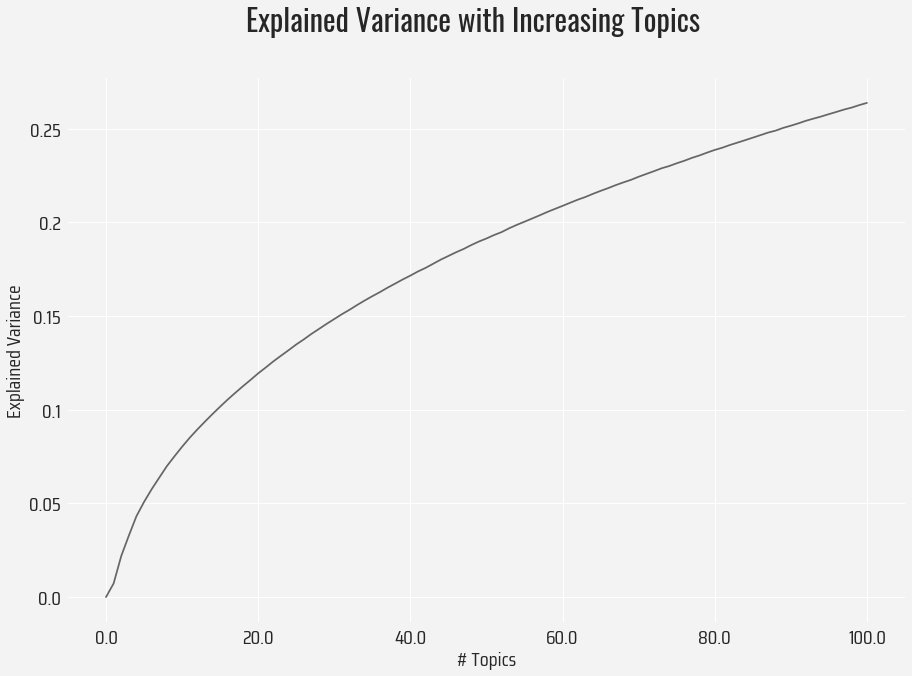

In [178]:
fig, ax = plt.subplots(figsize=(15,10))
fig.set_facecolor('#f3f3f3')
ax.set_facecolor('#f3f3f3')

fig.suptitle('Explained Variance with Increasing Topics', font_properties = header_font, fontsize = 30)

ax.plot([topic for topic, variance in topics_var], [variance for topic, variance in topics_var], color='#666666')

ax.set_xlabel('# Topics', fontproperties = text_font, fontsize = 20)
ax.set_xticklabels(ax.get_xticks(), fontproperties = text_font, fontsize = 20)

ax.set_ylabel('Explained Variance', fontproperties = text_font, fontsize = 20)
ax.set_yticks(np.round(np.arange(0, .3, .05),2))
ax.set_yticklabels(ax.get_yticks(), fontproperties = text_font, fontsize = 20)

plt.savefig('topics_var.png', facecolor = '#f3f3f3');

Explained variance continues to increase up through 100 topics. First, I'm going to try 25 topics and examine the most important words, as well as the articles most associated with each topic. Since the emphasis here is on interpretability, and the SVD components will only be a portion of the features, it would be ideal to have a manageable amount of topics. I plan to interpret each topic as they relate to their top words and highest related articles, and once that interpretation becomes less distinct, I will use that as a cutoff point.

In [71]:
lsa = TruncatedSVD(n_components = 25)
svd = lsa.fit_transform(top_tfidf)

In [64]:
topic_df = pd.DataFrame()

for row in range(len(svd)):
    for topic in range(len(svd[row])):
        topic_df.loc[row, f'topic_{topic}'] = svd[row][topic]

In [67]:
topic_df.head()

,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10,topic_11,topic_12,topic_13,topic_14,topic_15,topic_16,topic_17,topic_18,topic_19,topic_20,topic_21,topic_22,topic_23,topic_24,topic_25,topic_26,topic_27,topic_28,topic_29,topic_30,topic_31,topic_32,topic_33,topic_34,topic_35,topic_36,topic_37,topic_38,topic_39,topic_40,topic_41,topic_42,topic_43,topic_44,topic_45,topic_46,topic_47,topic_48,topic_49,topic_50,topic_51,topic_52,topic_53,topic_54,topic_55,topic_56,topic_57,topic_58,topic_59,topic_60,topic_61,topic_62,topic_63,topic_64,topic_65,topic_66,topic_67,topic_68,topic_69,topic_70,topic_71,topic_72,topic_73,topic_74,topic_75,topic_76,topic_77,topic_78,topic_79,topic_80,topic_81,topic_82,topic_83,topic_84,topic_85,topic_86,topic_87,topic_88,topic_89,topic_90,topic_91,topic_92,topic_93,topic_94,topic_95,topic_96,topic_97,topic_98,topic_99
0,0.276487,-0.037945,0.170243,0.039606,0.045657,0.019977,-0.088474,0.123434,-0.026234,-0.023865,-0.078692,0.001268,0.049470,-0.053831,0.045636,0.049804,-0.052380,0.087722,-0.012010,-0.003187,0.034280,0.071074,-0.048851,-0.026866,0.036959,-0.063399,-0.098791,-0.013163,-0.008208,-0.025661,0.045430,-0.023316,0.056991,-0.001110,0.008272,0.007793,0.034832,-0.023412,0.004491,-0.068379,-0.042127,0.019342,0.066459,-0.038467,0.005095,-0.021748,-0.008895,-0.006607,-0.011966,0.001510,-0.020677,-0.008510,0.000384,-0.035589,-0.043385,-0.021153,-0.037225,-0.003415,0.010116,0.045390,-0.018919,0.013983,0.001216,-0.013332,-0.023542,-0.031265,0.007075,-0.022902,-0.043880,-0.008538,-0.001190,-0.023822,0.019008,0.022301,0.039287,-0.066458,0.012138,-0.035579,0.003793,0.034655,0.008634,0.016111,-0.009451,0.002948,0.019480,0.001073,-0.027986,-0.029165,-0.007140,0.013233,0.011254,-0.010859,-0.013291,-0.055284,-0.002832,0.038762,0.000395,0.023132,0.057545,0.005903
1,0.211304,-0.036540,0.190594,0.016980,0.025131,0.034685,-0.119330,0.083734,-0.055037,0.023706,-0.110947,0.064326,-0.006903,-0.069907,-0.007226,0.032867,-0.064946,0.036101,0.008254,-0.026434,0.147968,0.135913,-0.157801,0.017189,0.026435,-0.079286,-0.016602,-0.015935,-0.049332,0.021480,-0.034607,0.014495,-0.008922,0.096337,0.002432,-0.024337,0.001660,-0.001650,-0.031694,0.065671,0.037631,-0.043269,-0.012216,-0.026691,-0.006571,0.015387,-0.012767,-0.002959,-0.092103,0.040519,-0.003854,-0.014961,0.014294,-0.016086,0.063368,0.001465,-0.069200,-0.009541,-0.006434,0.084811,-0.016346,-0.075853,0.011160,-0.022617,-0.040333,-0.026073,0.037172,-0.067512,0.055088,0.017892,-0.038445,0.000226,0.012500,0.014011,0.119562,0.059848,0.006843,-0.031105,-0.004791,0.069753,-0.024270,-0.019995,-0.060726,-0.039325,0.048605,-0.018307,0.039684,0.018093,0.015623,0.046528,-0.020959,0.014131,0.035285,-0.000124,0.065508,0.020926,0.001581,0.040812,-0.043850,0.016810
2,0.256047,-0.010999,0.248320,0.040155,0.066032,0.010456,-0.113370,0.125651,-0.037687,-0.016130,-0.133080,-0.011615,0.076958,-0.052238,0.035033,0.083000,-0.068159,0.079645,-0.035017,-0.039520,0.026018,0.096482,-0.068593,-0.039144,0.028297,-0.031116,-0.035849,-0.012265,0.064678,0.001188,-0.033191,0.020664,0.007164,0.047814,-0.035679,-0.068371,-0.038857,0.020451,0.052797,-0.044020,0.017385,0.002119,-0.005770,-0.013897,0.007863,-0.062488,-0.033396,-0.012226,-0.032445,0.002471,0.008891,-0.031043,0.018393,0.023163,0.055634,0.033476,-0.052243,0.001461,-0.020092,0.017259,-0.038141,-0.034733,-0.013323,-0.002352,-0.037248,-0.010914,0.023422,-0.002427,0.028214,0.004647,0.049671,-0.009291,0.015243,0.033786,-0.000126,0.024685,-0.002860,0.004451,0.012294,-0.004150,-0.022336,-0.029668,-0.000152,0.005200,0.008757,0.025341,-0.004442,-0.022937,-0.001187,-0.007050,-0.000394,0.001565,0.005037,0.004763,-0.018448,0.027319,0.008377,0.022111,-0.015609,0.021368
3,0.330337,0.292134,0.028491,0.279092,-0.022048,-0.161776,0.055013,-0.070581,-0.057730,-0.008390,-0.005473,-0.060885,-0.029669,-0.035575,0.019302,-0.015421,-0.005400,-0.004756,0.031835,-0.017160,-0.031318,0.056803,-0.031219,0.046014,0.018248,0.005594,0

In [32]:
#Code adapted from https://www.kaggle.com/rajmehra03/topic-modelling-using-lda-and-lsa-in-sklearn
for i, comp in enumerate(lsa.components_):
    vocab_comp = zip(top_tfidf.columns, comp)
    sorted_words = sorted(vocab_comp, key= lambda x:x[1], reverse=True)[:10]
    print("Topic "+str(i)+": ")
    for t in sorted_words:
        print(t[0],end=" ")
    print("\n")
    print(f'Top 5 articles:')
    print(sample.loc[topic_df.sort_values(f'topic_{i}', ascending = False)[:5].index, 'title'].tolist())
    print("\n")

Topic 0: 
datum model data value function learning use image feature dataset 

Top 5 articles:
['Data Science Crash Course', 'Machine Learning Field Guide', 'The Ultimate Glossary of Data Science', 'Deep Learning vs. Machine Learning', 'The Essential Guide to Creating an AI Product in 2020']


Topic 1: 
model image layer network training neural train feature function loss 

Top 5 articles:
['Implementing a Deep Neural Network for the CIFAR-10 dataset', '(In-depth) Machine Learning Image Classification With TensorFlow', 'Introduction to Convolutional Neural Network (CNN) using Tensorflow', 'Convolutional Neural Networks with Tensorflow', 'Building a Convolutional Neural Network to Recognize Shaved vs UnShaved Faces']


Topic 2: 
function column file python dataframe code pandas value list row 

Top 5 articles:
['80 Python Interview Practice Questions', 'Pandas Tricks that Expedite Data Analysis Process', 'A Complete Pandas Guide', '10 Python built-in functions you should know', 'How to 

These are some pretty awesome results! At 25 topics, we do start to see some overlap as topics become more granular (e.g. 'topic 24' seems to be NLP focused with an emphasis on twitter, while 'topic 5' looks more NLP focused in general). Since the earlier topics are both broader and capture more variance, I'm going to limit the feature choices to the topics that appear to share as little overlap with others in terms of words and the most associated articles. 

Final choices:

1. Topic 0 - How-to and general overviews
2. Topic 1 - Neural networks (CNNs)
3. Topic 2 - Data wrangling (Pandas)
4. Topic 3 - Computer vision
5. Topic 4 - Neural networks (intros)
6. Topic 5 - NLP
7. Topic 6 - COVID-19
8. Topic 7 - Reinforcement learning
9. Topic 8 - News pieces
10. Topic 9 - Clustering
11. Topic 11 - Trees
12. Topic 18 - SQL
13. Topic 19 - Finance (stocks)
14. Topic 20 - Recommendation systems
15. Topic 21 - Graphs
16. Topic 22 - Linear algebra

In [33]:
topic_cols = {'topic_0': 'howtos_overviews',
'topic_1': 'neuralnet_cnn',
'topic_2': 'datawrangling_pandas',
'topic_3': 'computer_vision',
'topic_4': 'neuralnet_intros',
'topic_5': 'nlp',
'topic_6': 'covid',
'topic_7': 'reinforcement_learning',
'topic_8': 'news',
'topic_9': 'clustering',
'topic_11': 'trees',
'topic_18': 'sql',
'topic_19': 'stocks_finance',
'topic_20': 'recommendation_algs',
'topic_21': 'graphs',
'topic_22': 'linalg'}

In [72]:
topic_df_final = (topic_df.rename(columns = topic_cols)
                  .drop([col for col in topic_df.columns if col not in topic_cols.keys()], 
                        axis = 1))
topic_df_final.head()

,howtos_overviews,neuralnet_cnn,datawrangling_pandas,computer_vision,neuralnet_intros,nlp,covid,reinforcement_learning,news,clustering,trees,sql,stocks_finance,recommendation_algs,graphs,linalg
0,0.276487,-0.037945,0.170243,0.039606,0.045657,0.019977,-0.088474,0.123434,-0.026234,-0.023865,0.001268,-0.012010,-0.003187,0.034280,0.071074,-0.048851
1,0.211304,-0.036540,0.190594,0.016980,0.025131,0.034685,-0.119330,0.083734,-0.055037,0.023706,0.064326,0.008254,-0.026434,0.147968,0.135913,-0.157801
2,0.256047,-0.010999,0.248320,0.040155,0.066032,0.010456,-0.113370,0.125651,-0.037687,-0.016130,-0.011615,-0.035017,-0.039520,0.026018,0.096482,-0.068593
3,0.330337,0.292134,0.028491,0.279092,-0.022048,-0.161776,0.055013,-0.070581,-0.057730,-0.008390,-0.060885,0.031835,-0.017160,-0.031318,0.056803,-0.031219
4,0.208830,0.005381,-0.142708,0.022487,-0.012532,0.023688,-0.001561,0.001221,0.115763,0.000160,-0.032263,-0.016706,0.005598,0.043468,-0.019596,0.014698


In [77]:
#Concatenating topics back into main df
sample_with_topics = pd.concat([sample, topic_df_final], axis = 1)

In [78]:
sample_with_topics.head()

,date,title,post,num_sections,num_images,num_codeblocks,num_videos,claps,tokens,pass_voice_perc,mean_sent_len,avg_word_len,post_len,section_len_prop,img_len_prop,codeblock_len_prop,section_img_ratio,unique_words,unique_words_prop,title_len,howtos_overviews,neuralnet_cnn,datawrangling_pandas,computer_vision,neuralnet_intros,nlp,covid,reinforcement_learning,news,clustering,trees,sql,stocks_finance,recommendation_algs,graphs,linalg
0,2020-01-01,Making Python Programs Blazingly Fast,"Python haters always say, that one of the reas...",14,1,9,0,3300,"(python, haters, always, say, ,, that, one, of...",0.156863,19.549020,6.284722,997,0.014042,0.001003,0.009027,0.071429,255,0.255767,5,0.276487,-0.037945,0.170243,0.039606,0.045657,0.019977,-0.088474,0.123434,-0.026234,-0.023865,0.001268,-0.012010,-0.003187,0.034280,0.071074,-0.048851
1,2020-01-01,6 New Features in Python 3.8 for Python Newbies,Languages change. Languages adapt. Python 2 is...,13,4,4,0,1700,"(languages, change, ., languages, adapt, ., py...",0.132075,12.622642,6.395137,669,0.019432,0.005979,0.005979,0.307692,191,0.285501,9,0.211304,-0.036540,0.190594,0.016980,0.025131,0.034685,-0.119330,0.083734,-0.055037,0.023706,0.064326,0.008254,-0.026434,0.147968,0.135913,-0.157801
2,2020-01-01,How to be fancy with Python,"Python is cool. Really cool. However, a lot of...",9,17,0,0,1600,"(python, is, cool, ., really, cool, ., however...",0.094340,11.962264,5.911765,634,0.014196,0.026814,0.000000,1.888889,151,0.238170,6,0.256047,-0.010999,0.248320,0.040155,0.066032,0.010456,-0.113370,0.125651,-0.037687,-0.016130,-0.011615,-0.035017,-0.039520,0.026018,0.096482,-0.068593
3,2020-01-01,Understanding and implementing a fully convolu...,Convolutional neural networks (CNN) work great...,14,1,4,0,254,"(convolutional, neural, networks, (, cnn, ), w...",0.205607,18.242991,6.738119,1952,0.007172,0.000512,0.002049,0.071429,430,0.220287,8,0.330337,0.292134,0.028491,0.279092,-0.022048,-0.161776,0.055013,-0.070581,-0.057730,-0.008390,-0.060885,0.031835,-0.017160,-0.031318,0.056803,-0.031219
4,2020-01-01,Perfectly Privacy-Preserving AI,Data privacy has been called “the most importa...,10,3,0,0,200,"(data, privacy, has, been, called, “, the, mos...",0.154930,19.676056,6.646007,1397,0.007158,0.002147,0.000000,0.300000,465,0.332856,4,0.208830,0.005381,-0.142708,0.022487,-0.012532,0.023688,-0.001561,0.001221,0.115763,0.000160,-0.032263,-0.016706,0.005598,0.043468,-0.019596,0.014698


# Visualization

We have a pretty solid set of features, so it's time to do some EDA. Below, I examine the target distribution, look for multicollinearity, and finally examine feature-target relationships for any evidence of non-linearity.

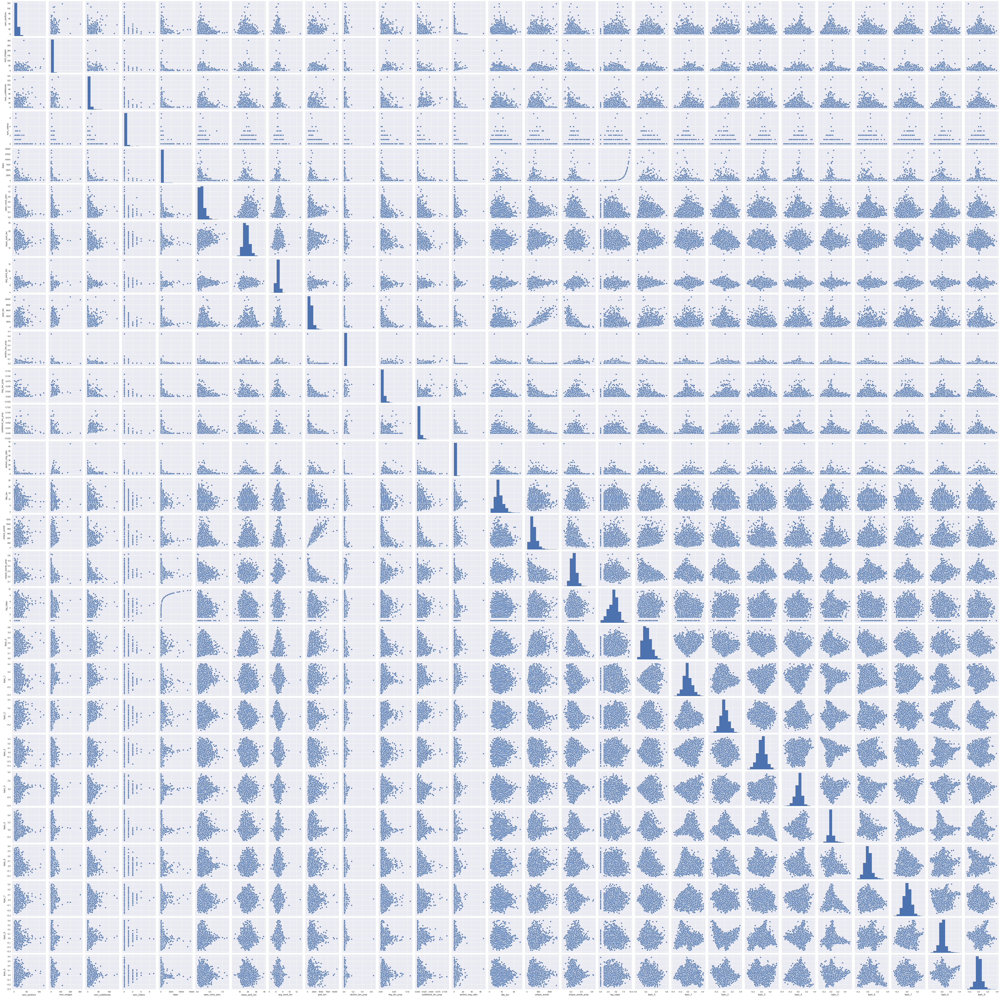

In [1144]:
#This is the absolute worst
sns.pairplot(sample_with_topics)

First, I want to look at the claps distribution. Putting my magnifying glass to the pairplot above, there appears to be quite a bit of right-tailed skew. 

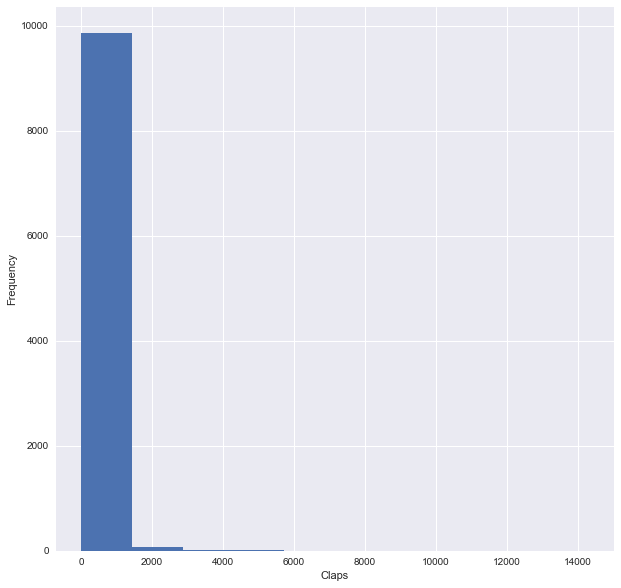

In [1343]:
plt.figure(figsize = (10,10))
plt.hist(sample_with_topics['claps'])
plt.xlabel('Claps')
plt.ylabel('Frequency');

Yup, this is pretty bad! This isn't necessarily surprising looking at the range of values in the ```sample.describe()``` block and being a reader of these articles. While these articles 

In short, I don't want to throw out articles disrupting this distribution's normality. These same "outlier" articles may actually be what we are most intrested in. First, we'll attempt a log transformations. Since the claps do contain 0s (i.e., no claps), I'll add a constant of 1 to allow us to take the logs while still transforming these values back to 0. 

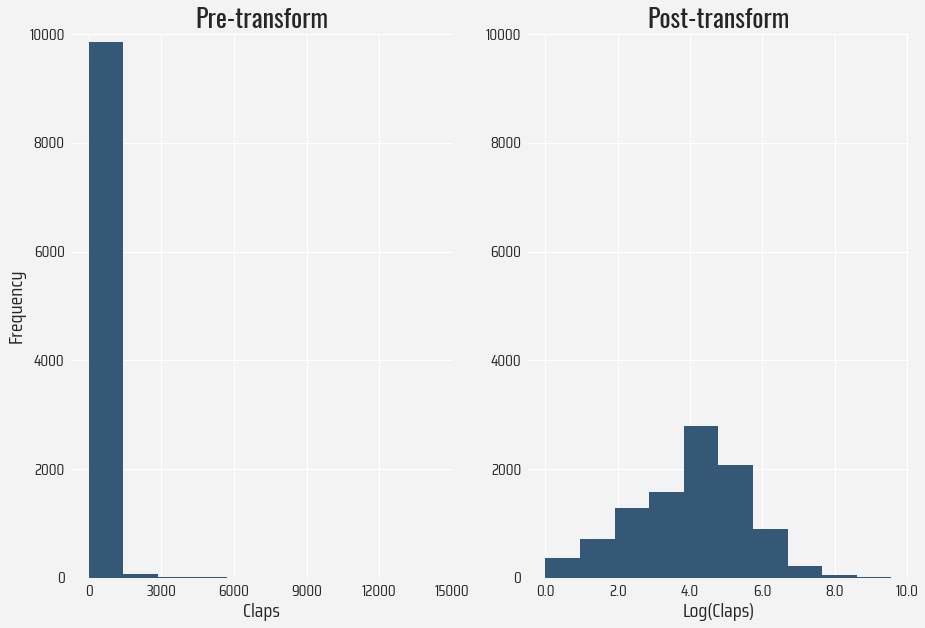

In [306]:
#Adding in a bunch of custom colors/fonts to test for final visualizations

fig, ax = plt.subplots(1,2, figsize=(15,10))

ax[0].hist(sample_with_topics['claps'], color = '#355876')
ax[0].set_title('Pre-transform', fontproperties = header_font, fontsize = 26)
ax[0].set_xlabel('Claps', fontproperties = text_font, fontsize = 20)
ax[0].set_ylabel('Frequency', fontproperties = text_font, fontsize = 20)
ax[0].set_facecolor('#f3f3f3')
ax[0].set_yticks(np.arange(0,12000,2000))
ax[0].set_ylim(0, 10000)
ax[0].set_yticklabels(ax[0].get_yticks(), fontproperties = text_font, fontsize = 16)
ax[0].set_xticks(np.arange(0, 18000, 3000))
ax[0].set_xticklabels(ax[0].get_xticks(), fontproperties = text_font, fontsize = 16)



ax[1].hist(np.log1p(sample_with_topics['claps']), color = '#355876')
ax[1].set_title('Post-transform', fontproperties = header_font, fontsize = 26)
ax[1].set_xlabel('Log(Claps)', fontproperties = text_font, fontsize = 20)
ax[1].set_facecolor('#f3f3f3')
ax[1].set_ylim(0, 10000)
ax[1].set_yticks(np.arange(0,12000,2000))
ax[1].set_yticklabels(ax[1].get_yticks(), fontproperties = text_font, fontsize = 16)
ax[1].set_xticklabels(ax[1].get_xticks(), fontproperties = text_font, fontsize = 16)

fig.set_facecolor('#f3f3f3');
#plt.savefig('claps_dist.png', facecolor = '#f3f3f3');

Much better! I'll be using the log of the target variable for future modeling.

Let's take a look at multicollinearity first. Rather than get a hellish grid, I'm going to get any pairs with correlations > .9.

In [188]:
def pairwise_multicollinearity(df, coefficient = .5):
    """
    
    Returns pairwise correlation coefficients above specified
    threshold. Default is .7.
    
    """
    
    corr_df = df.corr()
    corrs = []
    
    for idx, row in corr_df.iterrows():
        for val in row:
            if val > coefficient and val != 1:
                corr_loc = corr_df.loc[idx, row == val]
                #Check if pair already accounted for
                if [(pd.DataFrame(corr_loc).columns.tolist()[0], corr_loc.index[0]), val] not in corrs:
                    corrs.append([(corr_loc.index[0], pd.DataFrame(corr_loc).columns.tolist()[0]), val])
                else:
                    pass
            else:
                pass
            
    return corrs

In [189]:
multicoll_check = pairwise_multicollinearity(sample_with_topics)
print(multicoll_check)

[[('img_len_prop', 'num_images'), 0.5573130327586345], [('codeblock_len_prop', 'num_codeblocks'), 0.7285357557371107], [('unique_words', 'post_len'), 0.902957847376322]]


In [190]:
print(f'# of subplots needed: {len(multicoll_check)}')

# of subplots needed: 3


''

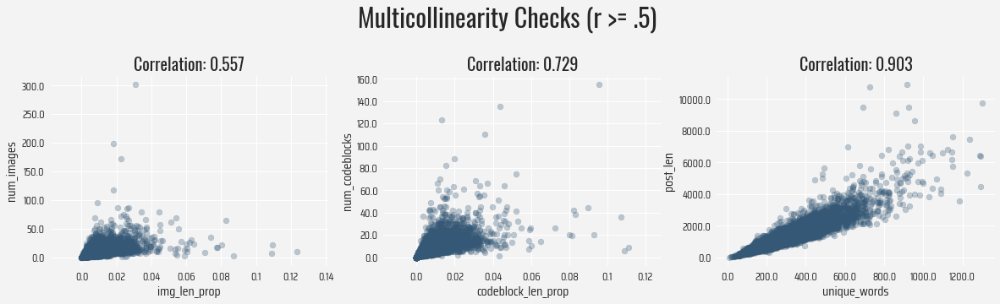

In [244]:
fig, ax = plt.subplots(1, 3, figsize = (20,5))
fig.set_facecolor('#f3f3f3')
#fig.subplots_adjust(top = .02, bottom = .01)
fig.suptitle('Multicollinearity Checks (r >= .5)', font_properties = header_font, fontsize = 30)
fig.subplots_adjust(top=0.75)

for i in range(len(multicoll_check)):
    
    x = sample_with_topics[multicoll_check[i][0][0]]
    y = sample_with_topics[multicoll_check[i][0][1]]
    
    ax[i].set_facecolor('#f3f3f3')
    ax[i].set_title('Correlation: {:.3f}'.format(multicoll_check[i][1]), font_properties = header_font, fontsize = 20)
    ax[i].scatter(x, y, color = '#355876',edgecolors='#355876', alpha = .3)
    
    ax[i].set_xlabel(multicoll_check[i][0][0], fontproperties = text_font, fontsize = 16)
    ax[i].set_xticklabels(np.round(ax[i].get_xticks(), 2), fontproperties = text_font, fontsize = 13)
    
    ax[i].set_ylabel(multicoll_check[i][0][1], fontproperties = text_font, fontsize = 16)
    ax[i].set_yticklabels(ax[i].get_yticks(), fontproperties = text_font, fontsize = 13)

#plt.savefig('multicoll_feature.png', facecolor = '#f3f3f3')
;

Need to keep an eye on these coefficients in the regression model.

Let's examine the feature->target relationships to see if anything non-linear pops out.

In [6]:
features = ['num_sections', 'num_images', 'num_codeblocks',
       'num_videos', 'pass_voice_perc', 'mean_sent_len',
       'avg_word_len', 'post_len', 'section_len_prop', 'img_len_prop',
       'codeblock_len_prop', 'section_img_ratio', 'unique_words',
       'unique_words_prop', 'title_len', 'howtos_overviews', 'neuralnet_cnn',
       'datawrangling_pandas', 'computer_vision', 'neuralnet_intros', 'nlp',
       'covid', 'reinforcement_learning', 'news', 'clustering', 'trees', 'sql',
       'stocks_finance', 'recommendation_algs', 'graphs', 'linalg']

target = np.log1p(sample_with_topics['claps'])

print(f'# of subplots needed: {len(features)}')

NameError: name 'np' is not defined

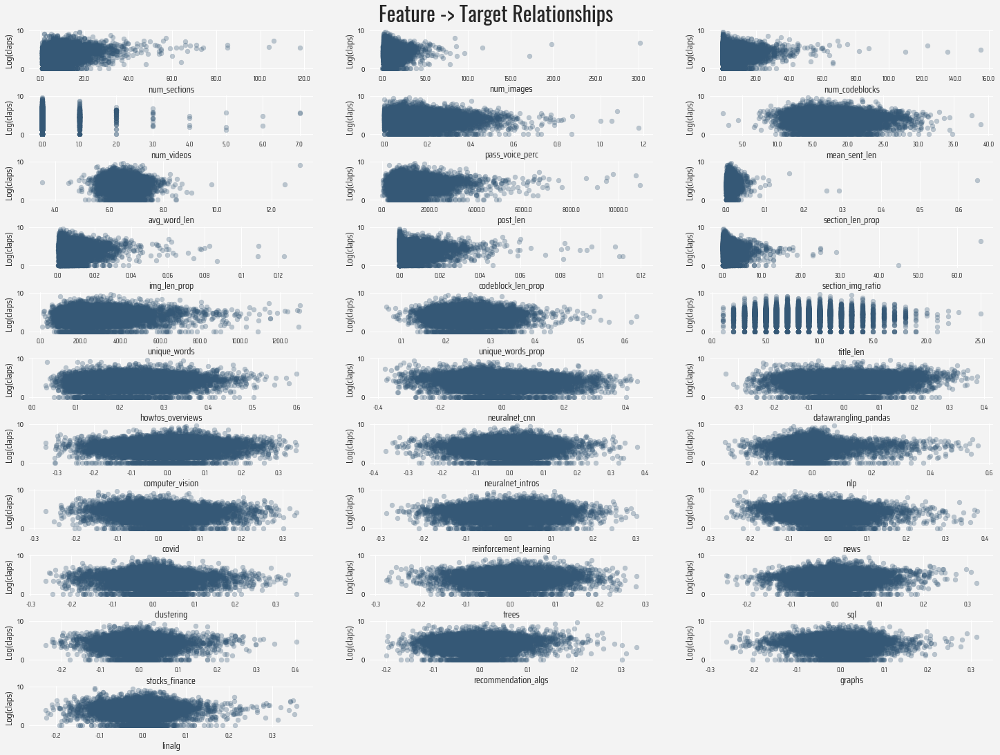

In [276]:
fig, ax = plt.subplots(11, 3, figsize = (25,17))
ax = ax.flatten()
fig.delaxes(ax[31])
fig.delaxes(ax[32])

fig.set_facecolor('#f3f3f3')

fig.suptitle('Feature -> Target Relationships', font_properties = header_font, fontsize = 30)
fig.subplots_adjust(top=0.95, hspace = .6)

for i in range(len(features)):
    
    ax[i].set_facecolor('#f3f3f3')
    
    ax[i].scatter(sample_with_topics[features[i]], target, color = '#355876',edgecolors='#355876', alpha = .3)
    
    ax[i].set_xlabel(features[i], fontproperties = text_font, fontsize = 14)
    ax[i].set_xticklabels(np.round(ax[i].get_xticks(), 2), fontproperties = text_font, fontsize = 10)
    
    ax[i].set_ylabel('Log(claps)', fontproperties = text_font, fontsize = 14)

    
plt.savefig('feature_targets.png', facecolor = '#f3f3f3')

# Word clouds

In [99]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [322]:
gen_overviews = sample_with_topics[sample_with_topics['title'].isin(['Data Science Crash Course', 'Machine Learning Field Guide', 'The Ultimate Glossary of Data Science', 'Deep Learning vs. Machine Learning', 'The Essential Guide to Creating an AI Product in 2020'])]['tokens'].map(lemmatize_post).tolist()
covid = sample_with_topics[sample_with_topics['title'].isin(['4 Ways to Analyse Pandemic Data (Covid-19)', 'Spot the Curve: Visualization of Cases Data on Coronavirus', 'How Many People Have Really Been Infected by SARS-COVID-19?', 'Coronavirus in the US — What’s Next?', 'An open-source code to analyze COVID-19 trends — Part I'])]['tokens'].map(lemmatize_post).tolist()

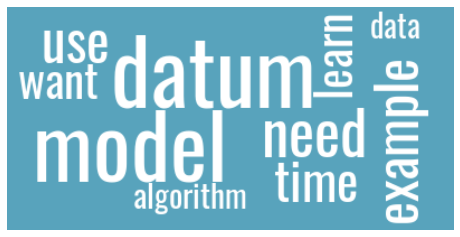

In [323]:
# Code adapted from https://www.datacamp.com/community/tutorials/wordcloud-python
text = ' '.join(str(tok) for tok in gen_overviews).replace("'", "")

wordcloud = WordCloud(font_path = '../Fonts/Oswald-VariableFont_wght.ttf',
                      color_func=lambda *args, **kwargs: "white",
                      max_words = 10, 
                      background_color = '#58a3bc').generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
#wordcloud.to_file('cloud2.png')

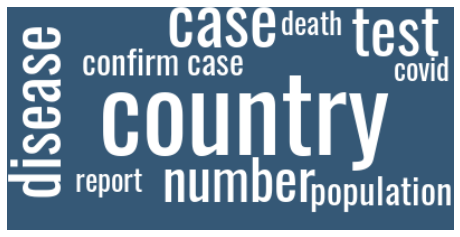

In [325]:
# Create and generate a word cloud image:
text = ' '.join(str(tok) for tok in covid).replace("'", "")

plt.figure()
wordcloud = WordCloud(font_path = '../Fonts/Oswald-VariableFont_wght.ttf',
                      color_func=lambda *args, **kwargs: "white",
                      max_words = 10, 
                      background_color = '#355876').generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
#wordcloud.to_file('cloud1.png')


---

# Conclusion 
The good news is that there doesn't appear to be rampant multicollinearity. However, I did have to transform the target, and there don't appear to be extremely strong relationships between the features and target from the plots. 

In [ ]:
#sample_with_topics.to_pickle('../Data/medium_2020_processed.pkl')